### <strong><font color=cornflowerblue>第四次作品：卷積神經網路 CNN 於影像去模糊與超解析之應用</font></strong>
學號：411078064

姓名：謝意盛
<hr>

### <strong>作品目標</strong>：
本實驗旨在系統性探討卷積神經網路（CNN）於影像去模糊化與超解析任務中的應用成效。實驗流程設計如下，首先將訓練集圖片進行等比例裁切，獲得長寬相等的小圖（patch）作為基礎資料。隨後，對每一小圖施加高斯模糊處理（Gaussian Blur），並進行一次縮小至原尺寸三分之一後再放大回原尺寸的操作，以模擬真實情境下更為複雜的模糊退化（即雙重模糊）效果。接著，利用多種不同結構之 CNN 模型對這些模糊圖像進行去模糊訓練，並將測試集圖片同樣處理後，輸入至已訓練完成之模型進行去模糊化預測。為評估模型性能，將針對原圖、模糊圖與去模糊圖分別計算 PSNR（Peak Signal-to-Noise Ratio, 峰值訊雜比）指標，以客觀衡量各模型對於去模糊化的效果及其泛化能力，進而選擇最具效能之模型。最後，將所選模型應用於額外一張未參與訓練與測試之圖片，進行同樣的高斯模糊及去模糊化處理，觀察其復原效果，以檢驗模型的實用性與泛用性。

<hr>

#### <strong>參考資料</font>：

1. 汪群超 Chun-Chao Wang 老師講義：https://ntpuccw.blog/python-in-learning/

2. 教學網站：https://debuggercafe.com/image-deblurring-using-convolutional-neural-networks-and-deep-learning/

3. 參考論文（2.1、2.2、2.3 里的模型出處）：https://www.researchgate.net/publication/328985265_Image_Deblurring_and_Super-Resolution_Using_Deep_Convolutional_Neural_Networks#fullTextFileContent

<hr>

#### <strong>套件宣告</strong>：

In [1]:
import os, time, socket
from platform import python_version
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from tqdm import tqdm
from PIL import Image

# 模型所需套件
from sklearn.model_selection import train_test_split
import torch, cv2
import torch.nn as nn
import torch.optim as optim
from torchvision import transforms
from torchvision.transforms import transforms
from torch.utils.data import Dataset, DataLoader
# 自定義 module (Deblurring_defs.py)
from Deblurring_defs import  (
    DeblurCNN, DeblurCNN_RES, DeblurSuperResCNN, 
    DnCNN, EDSR_Deblur, 
    DeblurDataset, psnr, fit, validate
)

# 中文字體套件
# from matplotlib.font_manager import FontProperties
# fonts = FontProperties(fname = "C:\\Windows\\Fonts\\msjh.ttc")
# plt.rcParams['font.family'] = 'Microsoft JhengHei'  # 微軟正黑體
# plt.rcdefaults()  # 重置全部 matplotlib 設定

# print("【日期時間】{}".format(time.strftime("%Y/%m/%d %H:%M:%S")))
# print("【工作目錄】{}".format(os.getcwd()))
# print("【主機名稱】{} ({})".format(socket.gethostname(),socket.gethostbyname(socket.gethostname())))
# print("【Python】{}".format(python_version()))
# print("【虛擬環境】{}".format(os.environ.get('VIRTUAL_ENV')))  # 查看使用的虛擬環境


<hr>
<hr>

### **<font color=cornflowerblue>第 0 步：訓練集的準備與設定説明</font>**  

本實驗使用 **T91 圖片集** 作爲本次實驗的圖片訓練集，共有 91 張圖片。本次訓練集模糊化處理方式會結合高斯模糊化 + 縮小放大 1/3 將圖片進行模糊化，以此達到模擬真實世界的模糊情況。

本實驗使用 **T91 圖片集** 作為訓練資料來源，共計 91 張圖片。為模擬真實世界中的模糊情境，本實驗採用結合 **高斯模糊處理與 1/3 縮放退化** 的方式對圖片進行模糊化處理，以產生模擬模糊樣本作為模型訓練之基礎。

- 處理過程：**每張圖片裁切為 $35 \times 35$ 的小圖，共 21721 張小圖 &#8594; 逐一進行高斯模糊處理 &#8594; 圖片縮小為原尺寸的 1/3，再放大回原尺寸 &#8594; 分別儲存清晰圖與模糊圖版本。**

- 高斯模糊之參數設定如下：

    **示範程式碼預設值 &#8594; 本實驗使用之設定值**
    1. `圖片大小（SIZE）` : 33 &#8594; 35。

    1. `高斯核大小（GAUSSIAN_KERNEL_SIZE_PATCH）` : (5, 5) &#8594; (7, 7)。

    1. `高斯核標準差（SIGMAX）` : 0 （不變）。

執行程式碼： Deblurring_data_preparation.ipynb

清晰與模糊影像儲存位置： inputs/sharp_patches , inputs/blurred_patches

訓練集來源： https://www.kaggle.com/datasets/ll01dm/t91-image-dataset

<hr>
<hr>

### **<font color=cornflowerblue>第 1 步：模型訓練前處理</font>**  

CNN 模型屬於深度學習的範疇，因此在模型設定上會比較複雜，下面會一步步做模型訓練的前處理，包含：

1.1 宣告 Global 常數 

1.2 準備訓練與測試資料

#### **1.1 宣告 Global 常數**

設定模型超參數與文件儲存路徑，以下注重説明超參數定義：

**示範程式碼預設值 &#8594; 本實驗使用之設定值**
- `IMG_RESIZE` : (33, 33) &#8594; (35, 35)

    - 設定輸入影像的尺寸，需與訓練資料中小圖（patch）的大小一致。本實驗中每張圖片被切割為 $35 \times 35$ 像素的小圖，因此模型也應接收相同大小的輸入。

- `BATCH_SIZE` : 2 &#8594; 30

    - 批次大小（Batch Size），表示每次訓練迭代中輸入模型的樣本數量。設定為 **30** 可在記憶體使用與訓練穩定性之間取得平衡。

- `LEARNING_RATE` : 0.001 &#8594; 0.0005

    - 學習率（Learning Rate），控制模型每次更新權重的幅度。值太大可能導致訓練不穩定，太小則可能收斂過慢；本實驗設定為 **0.0005**，屬於常見的中小幅度，利於穩定學習。

- `NUM_EPOCHS` : 10 &#8594; 202

    - 訓練週期數（Epochs），即模型將整個訓練資料集完整學習幾次。設為 **202**，可確保模型有充足時間進行訓練以達收斂。但是，本實驗最終在呈現上只會顯示 2 次，以節省版面位置

In [3]:
# 專案主目錄路徑
DIR_PATH = '../'

# 模型超參數
IMG_RESIZE = (35, 35) # 注意：依據訓練資料大小不同，將訓練影像大小做修改
BATCH_SIZE = 30
LEARNING_RATE = 0.0005 # Learning rate.
NUM_EPOCHS = 2 # Number of epochs to train the model

# 模型儲存的檔案名字
WEIGHTS_CNN = DIR_PATH + 'outputs/pre_trained_model_cnn.pt' # Path to the pre-trained model
WEIGHTS_RES = DIR_PATH + 'outputs/pre_trained_model_res.pt' # Path to the pre-trained model
WEIGHTS_SPRES = DIR_PATH + 'outputs/pre_trained_model_spres.pt' # Path to the pre-trained model
WEIGHTS_DNCNN = DIR_PATH + 'outputs/pre_trained_model_dncnn.pt' # Path to the pre-trained model
WEIGHTS_EDSR = DIR_PATH + 'outputs/pre_trained_model_edsr.pt' # Path to the pre-trained model

# 訓練集路徑
blur_path = DIR_PATH + 'inputs/T91_blurred_patches' # Directory containing the blurred images
sharp_path = DIR_PATH + 'inputs/T91_sharp_patches' # Directory containing the sharp images

# Create the directory to save the images if it doesn't exist
image_dir = DIR_PATH + 'outputs/saved_images' # Directory to save validation images during training
os.makedirs(image_dir, exist_ok=True)

# 平行運算
# print("CPU 核心數 (logical threads):", os.cpu_count())
# torch.set_num_threads(8)  # 使用 4 顆 CPU 執行緒


<hr>

#### **1.2 準備訓練與測試資料**

In [159]:
gauss_blur = os.listdir(blur_path)
gauss_blur.sort()
sharp = os.listdir(sharp_path)
sharp.sort()
x_blur = [] # images names for gauss blurred images
for i in range(len(gauss_blur)):
    x_blur.append(gauss_blur[i])
y_sharp = [] # images names for sharp images
for i in range(len(sharp)):
    y_sharp.append(sharp[i])

(x_train, x_val, y_train, y_val) = train_test_split(x_blur, y_sharp, test_size=0.1)
print(f"Train data instances: {len(x_train)}")
print(f"Validation data instances: {len(x_val)}")

# define transforms to resize and convert images to tensor
transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize(IMG_RESIZE), # Resize images to IMG_RESIZE for training
    transforms.ToTensor(),
])

train_data = DeblurDataset(blur_path, x_train, sharp_path, y_train, transform)
val_data = DeblurDataset(blur_path, x_val, sharp_path, y_val, transform)
 
trainloader = DataLoader(train_data, batch_size=BATCH_SIZE, shuffle=True)
valloader = DataLoader(val_data, batch_size=1, shuffle=False)


Train data instances: 19548
Validation data instances: 2173


<hr>
<hr>

### **<font color=cornflowerblue>第 2 步：開始模型訓練</font>**  

本實驗使用五種 CNN 模型進行訓練，分別是 **DeblurCNN model**、**DeblurCNN_RES model**、**DeblurSuperResCNN model**、**DnCNN model**、以及 **EDSR model**。以下分別針對這五種模型分別執行 202 次 epochs 的訓練（但最終呈現時只會顯示 2 次 epochs 的訓練，以節省版面位置），並逐一記錄每次 epoch 的 Loss 值和計算出 PSNR 值，以繪製出每次 epoch 的 Loss 和 PSNR 的趨勢圖，觀察每種模型的訓練 Loss、PSNR 與測試 Loss、PSNR 在每次訓練的收斂情況。 

内容包含：

- 模型介紹與架構設定，以及與示範模型的架構差異。

    1. 模型初始化與超參數設定。

    2. 繼續先前訓練的模型（若有）。

    3. 進行訓練。

    4. 畫出 epochs 的 Loss 和 PSNR 的趨勢圖。

#### **2.1 DeblurCNN 模型**

DeblurCNN 模型是最基本的 SRCNN（Super-Resolution Convolutional Neural Network）模型，其核心概念為利用卷積神經網路直接從模糊或低解析度的影像中學習到影像細節，以達到影像復原（如去模糊、超解析）的目的。

原始 DeblurCNN 之架構相對簡單，僅包含三層卷積：

<!-- - 第一層卷積層為較大的 9×9 卷積核，將輸入影像從 3 個通道提升至 64 個特徵通道，捕捉影像初步的全域特徵。

- 第二層卷積為 1×1 的卷積核，特徵通道從 64 壓縮至 32，起到特徵維度壓縮的作用。

- 第三層為 5×5 卷積核，將特徵由 32 個通道降回 3 通道，直接輸出重建後的影像。 -->

- 第一層：

    - 層類型：Conv2d

    - 參數：in_channels=3, out_channels=64, kernel_size=9, padding=2

    - 啟用函數：ReLU

- 第二層：

    - 層類型：Conv2d

    - 參數：in_channels=64, out_channels=32, kernel_size=1, padding=2

    - 啟用函數：ReLU

- 第三層（輸出層）：

    - 層類型：Conv2d

    - 參數：in_channels=32, out_channels=3, kernel_size=5, padding=2

    - 啟用函數：無（直接輸出重建圖像）

而本實驗中，我們針對原始的 DeblurCNN 模型進行了一些結構上的調整與擴充，提出一個更深且更具正則化的 DeblurCNN 變體架構：

<!-- - 將原本僅有三層的結構擴展為四個卷積區塊加上一個輸出層（共五層卷積）。

- 卷積層使用了不同大小的卷積核（9×9、5×5、3×3、3×3、3×3）以逐步擷取影像不同尺度的特徵細節。

- 特徵通道數也有所增加（128→64→64→32→3），以增強模型的特徵擷取能力。

- 每個卷積層後都加入了 ReLU 激活函數，增加非線性擬合能力。

- 特別在每個卷積區塊之後新增了 Dropout2d 正則化層（dropout_rate=0.2），有助於防止模型過度擬合，提升泛化能力。 -->

- 第一層：

    - 層類型：Conv2d

    - 參數：in_channels=3, out_channels=128, kernel_size=9, padding=4

    - 啟用函數：ReLU

    - Dropout：Dropout2d(p=0.2)
    
- 第二層：

    - 層類型：Conv2d

    - 參數：in_channels=128, out_channels=64, kernel_size=5, padding=2

    - 啟用函數：ReLU

    - Dropout：Dropout2d(p=0.2)
    
- 第三層：

    - 層類型：Conv2d

    - 參數：in_channels=64, out_channels=64, kernel_size=3, padding=1

    - 啟用函數：ReLU

    - Dropout：Dropout2d(p=0.2)
    
- 第四層：

    - 層類型：Conv2d

    - 參數：in_channels=64, out_channels=32, kernel_size=3, padding=1

    - 啟用函數：ReLU

    - Dropout：Dropout2d(p=0.2)
    
- 第五層（輸出層）：

    - 層類型：Conv2d

    - 參數：in_channels=32, out_channels=3, kernel_size=3, padding=1

    - 啟用函數：無（直接輸出）

    - Dropout：無

綜合以上，<font color=red>**更動之處**</font>可簡述為：

- 層數增加：3 層 → 5 層（含輸出層）。

- 特徵通道數增加：最大 64 → 最大 128。

- 新增正則化機制：在各層卷積後新增 Dropout，以提升泛化能力。

- 調整卷積核大小與填充 (padding)：確保輸出影像尺寸與輸入尺寸一致，便於更直接的影像復原比較。

這些改動使得 DeblurCNN 模型能更有效地捕捉多尺度的影像特徵，同時透過 Dropout 機制改善過擬合問題，有望達到比原始 SRCNN 模型更好的去模糊效果。

**文獻來源**： 上文**參考資料**里的論文。

**SRCNN 模型架構示意圖：** \
![SRCNN 模型架構](https://miro.medium.com/v2/resize:fit:979/0*aXe4ptFFMUednX7e.png)

##### **2.1.1 模型初始化與超參數設定**

- `Device` : CPU

- `Learning rate` : 0.0005

- `Optimizer` : Adam

- `Loss Function` : MSELoss

In [160]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
# device = 'cpu'
print('Using {} device'.format(device))

# 選擇模型
model = DeblurCNN().to(device)

print(f"Model: {model}")

total_params = sum(p.numel() for p in model.parameters())
print(f"{total_params:,} total parameters.")

total_trainable_params = sum(
        p.numel() for p in model.parameters() if p.requires_grad)
print(f"{total_trainable_params:,} training parameters.")

lr = LEARNING_RATE # Learning rate.
optimizer = optim.Adam(model.parameters(), lr=lr)
print(f"Learning rate: {lr}")
print(f"Optimizer: {optimizer}")
# Loss function.
criterion = nn.MSELoss()
print(f"Loss function: {criterion}")

# scheduler is to reduce the learning rate when a monitored metric (like validation loss) stops improving
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau( 
        optimizer,
        mode='min',
        patience=5,
        factor=0.5,
        # verbose=True
    )


Using cpu device
Model: DeblurCNN(
  (conv1): Sequential(
    (0): Conv2d(3, 128, kernel_size=(9, 9), stride=(1, 1), padding=(4, 4))
    (1): ReLU()
    (2): Dropout2d(p=0.2, inplace=False)
  )
  (conv2): Sequential(
    (0): Conv2d(128, 64, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (1): ReLU()
    (2): Dropout2d(p=0.2, inplace=False)
  )
  (conv3): Sequential(
    (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): Dropout2d(p=0.2, inplace=False)
  )
  (conv4): Sequential(
    (0): Conv2d(64, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): Dropout2d(p=0.2, inplace=False)
  )
  (output_layer): Conv2d(32, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
)
292,355 total parameters.
292,355 training parameters.
Learning rate: 0.0005
Optimizer: Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    decoupled_weight_decay: False
    differentiable: False
    e

##### **2.1.2 繼續先前訓練的模型（若有）**

In [161]:
if isinstance(model, DeblurCNN):
    WEIGHTS = WEIGHTS_CNN
    print("目前使用的是 DeblurCNN 模型")
elif isinstance(model, DeblurCNN_RES):
    WEIGHTS = WEIGHTS_RES
    print("目前使用的是 DeblurCNN_RES 模型")
elif isinstance(model, DeblurSuperResCNN):
    WEIGHTS = WEIGHTS_SPRES
    print("目前使用的是 DeblurSuperResCNN 模型")
elif isinstance(model, DnCNN):
    WEIGHTS = WEIGHTS_DNCNN
    print("目前使用的是 DnCNN 模型")
elif isinstance(model, EDSR_Deblur):
    WEIGHTS = WEIGHTS_EDSR
    print("目前使用的是 EDSR_Deblur 模型")

# resume training if weights are present.
if os.path.exists(WEIGHTS):
    print('Weights file found. Resuming training...')

    checkpoint = torch.load(WEIGHTS)
    print("Resuming the model state...")
    model.load_state_dict(checkpoint['model_state_dict'])
    pre_trained_epoch = checkpoint['epoch']
    print(f"Resuming training from epoch: {pre_trained_epoch}")
    # Load the optimizer state if available. may not be good idea to resume.
    print("Resuming the optimizer state...")
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
else:
    pre_trained_epoch = 0
    print('No pre-trained file found. Starting training from scratch...')
# print(f"Current Model: {model}")


目前使用的是 DeblurCNN 模型
Weights file found. Resuming training...
Resuming the model state...
Resuming training from epoch: 200
Resuming the optimizer state...


##### **2.1.3 進行訓練**

In [ ]:
train_loss, val_loss = [], []
train_psnr, val_psnr = [], []
start_time = time.time()
epochs = NUM_EPOCHS
for epoch in range(epochs):
    print(f"Epoch {epoch+1} of {epochs}")
    
    train_epoch_loss, train_epoch_psnr = fit(model, trainloader, device, optimizer, criterion)
    val_epoch_loss, val_epoch_psnr = validate(model, valloader, device, criterion)
    train_loss.append(train_epoch_loss)
    train_psnr.append(train_epoch_psnr)
    val_loss.append(val_epoch_loss)
    val_psnr.append(val_epoch_psnr)
    scheduler.step(val_epoch_loss)

end_time = time.time()
print(f"Took {((end_time-start_time)/60):.3f} minutes to train")
print('Saving model...')
# save the model
cumulative_epochs = epochs + pre_trained_epoch

# WEIGHTS_CNN, WEIGHTS_RES, WEIGHTS_SPRES
torch.save({
    'epoch': cumulative_epochs,
    'model_state_dict': model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
    'train_loss': train_loss,
    'val_loss': val_loss,
    'train_psnr': train_psnr,
    'val_psnr': val_psnr
}, WEIGHTS)
print(f"Model saved as {WEIGHTS}")

# 1st 217m 13.6s
# 2nd 206m 4.3s
# 3rd 208m 7.5s
# 4th 393m 42.4s
# 5th 232m 9.2s


Epoch 1 of 2


  0%|          | 0/652 [00:00<?, ?it/s]

100%|██████████| 652/652 [01:09<00:00,  9.43it/s]


Train Loss: 0.00020 - Train PSNR: 22.38 dB


100%|██████████| 2173/2173 [00:07<00:00, 279.85it/s]


Val Loss: 0.00330 - Val PSNR: 26.51 dB
Epoch 2 of 2


100%|██████████| 652/652 [00:59<00:00, 10.94it/s]


Train Loss: 0.00020 - Train PSNR: 22.37 dB


100%|██████████| 2173/2173 [00:07<00:00, 285.66it/s]

Val Loss: 0.00330 - Val PSNR: 26.51 dB
Took 2.401 minutes to train
Saving model...
Model saved as ../outputs/pre_trained_model_cnn.pt


##### **2.1.4 畫出 epochs 的 Loss 和 PSNR 的趨勢圖**

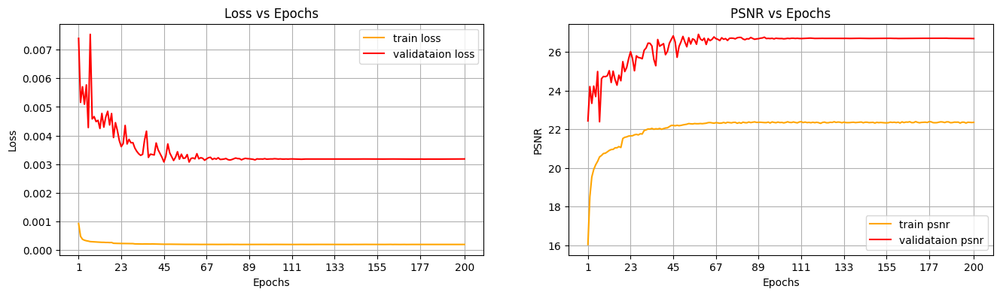

In [90]:
# loss plots
if isinstance(model, DeblurCNN):
    FIG_PATH = f'outputs/loss_psnr_cnn_{cumulative_epochs}.png'
elif isinstance(model, DeblurCNN_RES):
    FIG_PATH = f'outputs/loss_psnr_res_{cumulative_epochs}.png'
elif isinstance(model, DeblurSuperResCNN):
    FIG_PATH = f'outputs/loss_psnr_spres_{cumulative_epochs}.png'
elif isinstance(model, DnCNN):
    FIG_PATH = f'outputs/loss_psnr_dncnn_{cumulative_epochs}.png'
elif isinstance(model, EDSR_Deblur):
    FIG_PATH = f'outputs/loss_psnr_edsr_{cumulative_epochs}.png'

fig, ax = plt.subplots(1, 2, figsize=(16, 4))
ax[0].plot(train_loss, color='orange', label='train loss')
ax[0].plot(val_loss, color='red', label='validataion loss')

num_points = len(train_loss)
num_ticks = 10 if num_points >= 10 else num_points
tick_positions = np.linspace(0, num_points-1, num_ticks, dtype=int)
tick_labels = [pre_trained_epoch + i + 1 for i in tick_positions]
ax[0].set_xticks(ticks=tick_positions, labels=tick_labels)

ax[0].set_title('Loss vs Epochs')
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Loss')
ax[0].legend()
ax[0].grid()

ax[1].plot(train_psnr, color='orange', label='train psnr')
ax[1].plot(val_psnr, color='red', label='validataion psnr')
ax[1].set_xticks(ticks=tick_positions, labels=tick_labels)
ax[1].set_title('PSNR vs Epochs')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('PSNR')
ax[1].legend()
ax[1].grid()

plt.savefig(DIR_PATH + FIG_PATH)
plt.show()

##### **注意事項與討論：**  

- 本實驗以改良版 DeblurCNN 模型對經雙重模糊處理的 T91 訓練集進行去模糊化訓練與驗證。

- 從圖中可觀察到，隨著訓練次數增加，左圖中的 Validation Loss 持續下降，而右圖中的 Validation PSNR 則逐漸上升，顯示模型效能穩定提升。當訓練進行至第 90 個 Epoch 左右時，兩者皆趨於穩定，代表模型已進入收斂階段。最終收斂結果如下：
    - Train Loss: 約 0.0002
    - Validation Loss: 約 0.0031
    - Train PSNR: 約 22.5
    - Validation PSNR: 約 27

- 相較於示範程式中的原始模型，本實驗所使用的改良版模型在收斂速度與最終效果上皆有更佳表現。然而，由於篇幅限制，此處不展示原始模型的完整結果。該模型將於後續實驗中與其他模型進行綜合比較，以選出表現最佳的模型。

<hr>

#### **2.2 DeblurCNN_RES 模型**

DeblurCNN_RES 模型是基於 SRCNN 模型進一步加入「殘差連接（Residual Connection）」的變體。原始論文的模型架構特點如下：

<!-- - 第一層卷積層採用較大的卷積核（9×9），輸入 3 通道輸出 64 通道，初步萃取影像特徵。

- 第二層使用較小的 1×1 卷積核，將通道數從 64 降至 32，有效壓縮特徵維度。

- 第三層再透過 5×5 卷積核將通道數降回 3，重建原始影像大小與通道數。 -->

- 第一層：

    - 層類型：Conv2d

    - 參數：in_channels=3, out_channels=64, kernel_size=9, padding=2

    - 啟用函數：ReLU

- 第二層：

    - 層類型：Conv2d

    - 參數：in_channels=64, out_channels=32, kernel_size=1, padding=2

    - 啟用函數：ReLU

- 第三層（輸出層）：

    - 層類型：Conv2d

    - 參數：in_channels=32, out_channels=3, kernel_size=5, padding=2

    - 啟用函數：無（直接輸出）

    - 其他：殘差連接：輸出與輸入相加（out = x + identity）

與基本的 SRCNN 模型不同的是，DeblurCNN_RES 模型增加了殘差連接結構，即在輸出層將輸入（identity）與卷積結果相加。透過此方式，模型只需學習影像與其模糊版本之間的差異（殘差），而非直接學習整個影像，降低了學習難度，提升了訓練效果。

本實驗中，我們針對原始論文之 DeblurCNN_RES 架構進行了更進一步的調整與強化，提出了以下改進之模型架構：

<!-- - 卷積區塊數量從原本的三層增加為四個卷積區塊，再加上一層輸出卷積，共計五個卷積層，以增強模型特徵抽取的深度。

- 特徵通道數量有所增加，以獲得更豐富的特徵表示能力（原本最大 64 通道提升至最大 128 通道）。

- 每一個卷積區塊都新增了 Dropout2d 層（dropout_rate=0.2），作為正則化手段，降低模型訓練過程中過擬合的風險。

- 同時，所有卷積區塊皆採用 ReLU 作為非線性激活函數。

- 保留原始模型中的殘差連接（Residual Connection），即將輸入影像與模型輸出結果相加，以殘差學習概念協助模型快速穩定收斂。 -->

- 第一層：

    - 層類型：Conv2d

    - 參數：in_channels=3, out_channels=128, kernel_size=9, padding=4

    - 啟用函數：ReLU

    - Dropout：Dropout2d(p=0.2)
    
- 第二層：

    - 層類型：Conv2d

    - 參數：in_channels=128, out_channels=64, kernel_size=5, padding=2

    - 啟用函數：ReLU

    - Dropout：Dropout2d(p=0.2)
    
- 第三層：

    - 層類型：Conv2d

    - 參數：in_channels=64, out_channels=64, kernel_size=3, padding=1

    - 啟用函數：ReLU

    - Dropout：Dropout2d(p=0.2)
    
- 第四層：

    - 層類型：Conv2d

    - 參數：in_channels=64, out_channels=32, kernel_size=3, padding=1

    - 啟用函數：ReLU

    - Dropout：Dropout2d(p=0.2)
    
- 第五層（輸出層）：

    - 層類型：Conv2d

    - 參數：in_channels=32, out_channels=3, kernel_size=3, padding=1

    - 啟用函數：無（直接輸出）

    - Dropout：無

    - 其他：殘差連接：輸出與輸入相加（out = x + identity）

綜合以上，<font color=red>**更動之處**</font>可簡述為：

- 層數增加：3 層 → 5 層（含輸出層）。

- 特徵通道數增加：最大 64 → 最大 128。

- 新增正則化機制：在各層卷積後新增 Dropout，以提升泛化能力。

- 調整卷積核大小與填充 (padding)：確保輸出影像尺寸與輸入尺寸一致，便於更直接的影像復原比較。

總結而言，本實驗修改的 DeblurCNN_RES 模型架構相較於原始論文提出的版本，更加深層且複雜，具有更強大的特徵表示能力，同時透過 Dropout 正則化方法有效提升了模型的泛化能力，可望達到更好的影像去模糊效果。

**文獻來源**： 上文**參考資料**里的論文。

**DeblurCNN_RES 模型架構示意圖（原理相同，但實際參數與層數設定不太一樣）：** \
![DeblurCNN_RES 模型架構](https://machine-learning-note.readthedocs.io/en/latest/_images/VDSR.png)

##### **2.2.1 模型初始化與超參數設定**

- `Device` : CPU

- `Learning rate` : 0.0005

- `Optimizer` : Adam

- `Loss Function` : MSELoss

In [163]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
# device = 'cpu'
print('Using {} device'.format(device))

model = DeblurCNN_RES().to(device)

print(f"Model: {model}")

total_params = sum(p.numel() for p in model.parameters())
print(f"{total_params:,} total parameters.")

total_trainable_params = sum(
        p.numel() for p in model.parameters() if p.requires_grad)
print(f"{total_trainable_params:,} training parameters.")

lr = LEARNING_RATE # Learning rate.
optimizer = optim.Adam(model.parameters(), lr=lr)
print(f"Learning rate: {lr}")
print(f"Optimizer: {optimizer}")
# Loss function.
criterion = nn.MSELoss()
print(f"Loss function: {criterion}")

# scheduler is to reduce the learning rate when a monitored metric (like validation loss) stops improving
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau( 
        optimizer,
        mode='min',
        patience=5,
        factor=0.5,
        # verbose=True
    )


Using cpu device
Model: DeblurCNN_RES(
  (block1): Sequential(
    (0): Conv2d(3, 128, kernel_size=(9, 9), stride=(1, 1), padding=(4, 4))
    (1): ReLU()
    (2): Dropout2d(p=0.2, inplace=False)
  )
  (block2): Sequential(
    (0): Conv2d(128, 64, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (1): ReLU()
    (2): Dropout2d(p=0.2, inplace=False)
  )
  (block3): Sequential(
    (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): Dropout2d(p=0.2, inplace=False)
  )
  (block4): Sequential(
    (0): Conv2d(64, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): Dropout2d(p=0.2, inplace=False)
  )
  (output_conv): Conv2d(32, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
)
292,355 total parameters.
292,355 training parameters.
Learning rate: 0.0005
Optimizer: Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    decoupled_weight_decay: False
    differentiable: Fals

##### **2.2.2 繼續先前訓練的模型（若有）**

In [164]:
if isinstance(model, DeblurCNN):
    WEIGHTS = WEIGHTS_CNN
    print("目前使用的是 DeblurCNN 模型")
elif isinstance(model, DeblurCNN_RES):
    WEIGHTS = WEIGHTS_RES
    print("目前使用的是 DeblurCNN_RES 模型")
elif isinstance(model, DeblurSuperResCNN):
    WEIGHTS = WEIGHTS_SPRES
    print("目前使用的是 DeblurSuperResCNN 模型")
elif isinstance(model, DnCNN):
    WEIGHTS = WEIGHTS_DNCNN
    print("目前使用的是 DnCNN 模型")
elif isinstance(model, EDSR_Deblur):
    WEIGHTS = WEIGHTS_EDSR
    print("目前使用的是 EDSR_Deblur 模型")

# resume training if weights are present.
if os.path.exists(WEIGHTS):
    print('Weights file found. Resuming training...')

    checkpoint = torch.load(WEIGHTS)
    print("Resuming the model state...")
    model.load_state_dict(checkpoint['model_state_dict'])
    pre_trained_epoch = checkpoint['epoch']
    print(f"Resuming training from epoch: {pre_trained_epoch}")
    # Load the optimizer state if available. may not be good idea to resume.
    print("Resuming the optimizer state...")
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
else:
    pre_trained_epoch = 0
    print('No pre-trained file found. Starting training from scratch...')
# print(f"Current Model: {model}")


目前使用的是 DeblurCNN_RES 模型
Weights file found. Resuming training...
Resuming the model state...
Resuming training from epoch: 200
Resuming the optimizer state...


##### **2.2.3 進行訓練**

In [ ]:
train_loss, val_loss = [], []
train_psnr, val_psnr = [], []
start_time = time.time()
epochs = NUM_EPOCHS
for epoch in range(epochs):
    print(f"Epoch {epoch+1} of {epochs}")
    
    train_epoch_loss, train_epoch_psnr = fit(model, trainloader, device, optimizer, criterion)
    val_epoch_loss, val_epoch_psnr = validate(model, valloader, device, criterion)
    train_loss.append(train_epoch_loss)
    train_psnr.append(train_epoch_psnr)
    val_loss.append(val_epoch_loss)
    val_psnr.append(val_epoch_psnr)
    scheduler.step(val_epoch_loss)

end_time = time.time()
print(f"Took {((end_time-start_time)/60):.3f} minutes to train")
print('Saving model...')
# save the model
cumulative_epochs = epochs + pre_trained_epoch

# WEIGHTS_CNN, WEIGHTS_RES, WEIGHTS_SPRES
torch.save({
    'epoch': cumulative_epochs,
    'model_state_dict': model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
    'train_loss': train_loss,
    'val_loss': val_loss
}, WEIGHTS)
print(f"Model saved as {WEIGHTS}")

# 1st 217m 13.6s
# 2nd 206m 4.3s
# 3rd 208m 7.5s
# 4th 393m 42.4s
# 5th 232m 9.2s


Epoch 1 of 2


  0%|          | 0/652 [00:00<?, ?it/s]

100%|██████████| 652/652 [01:02<00:00, 10.44it/s]


Train Loss: 0.00007 - Train PSNR: 26.69 dB


100%|██████████| 2173/2173 [00:07<00:00, 291.06it/s]


Val Loss: 0.00213 - Val PSNR: 29.72 dB
Epoch 2 of 2


100%|██████████| 652/652 [01:07<00:00,  9.70it/s]


Train Loss: 0.00007 - Train PSNR: 26.70 dB


100%|██████████| 2173/2173 [00:07<00:00, 277.82it/s]

Val Loss: 0.00213 - Val PSNR: 29.73 dB
Took 2.416 minutes to train
Saving model...
Model saved as ../outputs/pre_trained_model_res.pt


##### **2.2.4 畫出 epochs 的 Loss 和 PSNR 的趨勢圖**

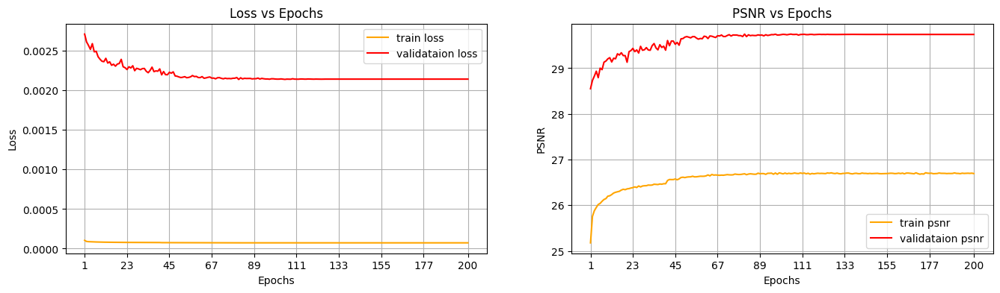

In [71]:
# loss plots
if isinstance(model, DeblurCNN):
    FIG_PATH = f'outputs/loss_psnr_cnn_{cumulative_epochs}.png'
elif isinstance(model, DeblurCNN_RES):
    FIG_PATH = f'outputs/loss_psnr_res_{cumulative_epochs}.png'
elif isinstance(model, DeblurSuperResCNN):
    FIG_PATH = f'outputs/loss_psnr_spres_{cumulative_epochs}.png'
elif isinstance(model, DnCNN):
    FIG_PATH = f'outputs/loss_psnr_dncnn_{cumulative_epochs}.png'
elif isinstance(model, EDSR_Deblur):
    FIG_PATH = f'outputs/loss_psnr_edsr_{cumulative_epochs}.png'

fig, ax = plt.subplots(1, 2, figsize=(16, 4))
ax[0].plot(train_loss, color='orange', label='train loss')
ax[0].plot(val_loss, color='red', label='validataion loss')

num_points = len(train_loss)
num_ticks = 10 if num_points >= 10 else num_points
tick_positions = np.linspace(0, num_points-1, num_ticks, dtype=int)
tick_labels = [pre_trained_epoch + i + 1 for i in tick_positions]
ax[0].set_xticks(ticks=tick_positions, labels=tick_labels)

ax[0].set_title('Loss vs Epochs')
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Loss')
ax[0].legend()
ax[0].grid()

ax[1].plot(train_psnr, color='orange', label='train psnr')
ax[1].plot(val_psnr, color='red', label='validataion psnr')
ax[1].set_xticks(ticks=tick_positions, labels=tick_labels)
ax[1].set_title('PSNR vs Epochs')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('PSNR')
ax[1].legend()
ax[1].grid()

# plt.savefig(DIR_PATH + FIG_PATH)
plt.show()


##### **注意事項與討論：**  

- 本實驗以改良版 DeblurCNN_RES 模型對經雙重模糊處理的 T91 訓練集進行去模糊化訓練與驗證。

- 從圖中可觀察到，隨著訓練次數增加，左圖中的 Validation Loss 持續下降，而右圖中的 Validation PSNR 則逐漸上升，顯示模型效能穩定提升。當訓練進行至第 70 個 Epoch 左右時，兩者皆趨於穩定，代表模型已進入收斂階段。最終收斂結果如下：
    - Train Loss: 約 0.0002
    - Validation Loss: 約 0.0022
    - Train PSNR: 約 26.7
    - Validation PSNR: 約 29.8

- 相較於示範程式中的原始模型，本實驗所使用的改良版模型在收斂速度與最終效果上皆有更佳表現。然而，由於篇幅限制，此處不展示原始模型的完整結果。

- 與先前的 DeblurCNN 模型相比，DeblurCNN_RES 在 Validation Loss 與 PSNR 表現上皆更優異，顯示該模型在訓練效果上確實具有更佳的性能。

<hr>

#### **2.3 DeblurSuperResCNN 模型**

DeblurSuperResCNN 模型是基於 SRCNN 模型進一步加入「特徵串接（Feature Concatenation）」的變體。原始論文的模型架構特點如下：

<!-- - 第一層與第二層卷積層：使用連續兩個 3×3 的卷積核，各層卷積後皆以 ReLU 激活函數處理影像特徵。

- 特徵串接（Feature Concatenation）：將第一層與第二層卷積層產生的特徵圖沿著通道（channel）維度串接起來，使第三層卷積可同時處理不同層次的特徵資訊，進一步強化模型的表示能力。

- 輸出層（第四層）：使用 3×3 卷積核，並以 Sigmoid 作為最終的激活函數，將輸出影像像素值約束在 (0, 1) 之間，適用於特定的影像正規化後處理。 -->

- 第一層：

    - 層類型：Conv2d

    - 參數：in_channels=3, out_channels=64, kernel_size=3, padding=1

    - 啟用函數：ReLU

- 第二層：

    - 層類型：Conv2d

    - 參數：in_channels=64, out_channels=64, kernel_size=3, padding=1

    - 啟用函數：ReLU

- 第三層（特徵融合後）：

    - 輸入資料：Concat(out1, out2) → shape = 128 channels

    - 層類型：Conv2d

    - 參數：in_channels=128, out_channels=128, kernel_size=3, padding=1

    - 啟用函數：ReLU

- 第四層（輸出層）：

    - 層類型：Conv2d

    - 參數：in_channels=128, out_channels=3, kernel_size=3, padding=1

    - 啟用函數：Sigmoid

在本次實驗中，我們針對原始的 DeblurSuperResCNN 架構進行進一步擴展與修改，提出了以下改良版本：

<!-- - 卷積層結構深度與複雜度提升：

    - 第一層卷積核大小增加至 9×9，通道數提升至 128，以更有效捕捉影像全域的特徵。

    - 第二層卷積核為 5×5，通道數為 64，進一步抽取更細緻的特徵。

    - 第三層卷積核為 3×3，將經串接後的 192 通道特徵圖降至 32 通道，提供更有效率的特徵精簡與融合。

    - 新增第四層卷積（3×3，32→32），進一步抽取精細特徵，提升模型處理複雜細節的能力。

- 新增 Dropout 正則化層：

    - 每個卷積層後均加入 Dropout2d（dropout_rate=0.2），以降低模型訓練時的過擬合風險，提升模型泛化能力。

- 輸出層修改：

    - 將原本使用的 Sigmoid 激活函數移除，改為不使用任何激活函數，以便於模型學習更靈活的像素值分布，更適合一般的影像復原任務。 -->

- 第一層：

    - 層類型：Conv2d

    - 參數：in_channels=3, out_channels=128, kernel_size=9, padding=4

    - 啟用函數：ReLU

    - Dropout：Dropout2d(p=0.2)

- 第二層：

    - 層類型：Conv2d

    - 參數：in_channels=128, out_channels=64, kernel_size=5, padding=2

    - 啟用函數：ReLU

    - Dropout：Dropout2d(p=0.2)

- 第三層（特徵融合後）：

    - 輸入資料：Concat(out1, out2) → shape = 192 channels

    - 層類型：Conv2d

    - 參數：in_channels=192, out_channels=32, kernel_size=3, padding=1

    - 啟用函數：ReLU

    - Dropout：Dropout2d(p=0.2)

- 第四層：

    - 層類型：Conv2d

    - 參數：in_channels=32, out_channels=32, kernel_size=3, padding=1

    - 啟用函數：ReLU

    - Dropout：Dropout2d(p=0.2)

- 第五層（輸出層）：

    - 層類型：Conv2d

    - 參數：in_channels=32, out_channels=3, kernel_size=3, padding=1

    - 啟用函數：無（直接輸出）

    - Dropout：無

綜合以上，<font color=red>**更動之處**</font>可簡述為：

- 層數增加：4 層 → 5 層（含輸出層）。

- 特徵通道數增加：最大 128 → 最大 192。

- 新增正則化機制：在各層卷積後新增 Dropout，以提升泛化能力。

- 調整卷積核大小（kernel）與填充 (padding)：確保輸出影像尺寸與輸入尺寸一致，便於更直接的影像復原比較。

- 輸出層：Sigmoid 激活函數 → 不使用任何激活函數

綜合以上，本實驗所改良的 DeblurSuperResCNN 模型較原始論文中的架構更加深層化與正則化，除了可提供更強大的特徵萃取能力外，也有效改善模型泛化表現，可望在影像去模糊與超解析任務中取得更佳的實際成效。

**文獻來源**： 上文**參考資料**里的論文。

**DeblurCNN_RES 模型架構示意圖：** \
![DeblurCNN_RES 模型架構](https://user-images.githubusercontent.com/16929158/45629859-4bd2dc80-ba8f-11e8-82f4-409c28a32777.png)

##### **2.3.1 模型初始化與超參數設定**

- `Device` : CPU

- `Learning rate` : 0.0005

- `Optimizer` : Adam

- `Loss Function` : MSELoss

In [166]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
# device = 'cpu'
print('Using {} device'.format(device))

model = DeblurSuperResCNN().to(device)

print(f"Model: {model}")

total_params = sum(p.numel() for p in model.parameters())
print(f"{total_params:,} total parameters.")

total_trainable_params = sum(
        p.numel() for p in model.parameters() if p.requires_grad)
print(f"{total_trainable_params:,} training parameters.")

lr = LEARNING_RATE # Learning rate.
optimizer = optim.Adam(model.parameters(), lr=lr)
print(f"Learning rate: {lr}")
print(f"Optimizer: {optimizer}")
# Loss function.
criterion = nn.MSELoss()
print(f"Loss function: {criterion}")

# scheduler is to reduce the learning rate when a monitored metric (like validation loss) stops improving
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau( 
        optimizer,
        mode='min',
        patience=5,
        factor=0.5,
        # verbose=True
    )


Using cpu device
Model: DeblurSuperResCNN(
  (conv1): Conv2d(3, 128, kernel_size=(9, 9), stride=(1, 1), padding=(4, 4))
  (relu1): ReLU()
  (dropout1): Dropout2d(p=0.2, inplace=False)
  (conv2): Conv2d(128, 64, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
  (relu2): ReLU()
  (dropout2): Dropout2d(p=0.2, inplace=False)
  (conv3): Conv2d(192, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu3): ReLU()
  (dropout3): Dropout2d(p=0.2, inplace=False)
  (conv4): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu4): ReLU()
  (dropout4): Dropout2d(p=0.2, inplace=False)
  (conv5): Conv2d(32, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
)
301,539 total parameters.
301,539 training parameters.
Learning rate: 0.0005
Optimizer: Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    decoupled_weight_decay: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0005
    maximiz

##### **2.3.2 繼續先前訓練的模型（若有）**

In [167]:
if isinstance(model, DeblurCNN):
    WEIGHTS = WEIGHTS_CNN
    print("目前使用的是 DeblurCNN 模型")
elif isinstance(model, DeblurCNN_RES):
    WEIGHTS = WEIGHTS_RES
    print("目前使用的是 DeblurCNN_RES 模型")
elif isinstance(model, DeblurSuperResCNN):
    WEIGHTS = WEIGHTS_SPRES
    print("目前使用的是 DeblurSuperResCNN 模型")
elif isinstance(model, DnCNN):
    WEIGHTS = WEIGHTS_DNCNN
    print("目前使用的是 DnCNN 模型")
elif isinstance(model, EDSR_Deblur):
    WEIGHTS = WEIGHTS_EDSR
    print("目前使用的是 EDSR_Deblur 模型")

# resume training if weights are present.
if os.path.exists(WEIGHTS):
    print('Weights file found. Resuming training...')

    checkpoint = torch.load(WEIGHTS)
    print("Resuming the model state...")
    model.load_state_dict(checkpoint['model_state_dict'])
    pre_trained_epoch = checkpoint['epoch']
    print(f"Resuming training from epoch: {pre_trained_epoch}")
    # Load the optimizer state if available. may not be good idea to resume.
    print("Resuming the optimizer state...")
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
else:
    pre_trained_epoch = 0
    print('No pre-trained file found. Starting training from scratch...')
# print(f"Current Model: {model}")


目前使用的是 DeblurSuperResCNN 模型
Weights file found. Resuming training...
Resuming the model state...
Resuming training from epoch: 200
Resuming the optimizer state...


##### **2.3.3 進行訓練**

In [168]:
train_loss, val_loss = [], []
train_psnr, val_psnr = [], []
start_time = time.time()
epochs = NUM_EPOCHS
for epoch in range(epochs):
    print(f"Epoch {epoch+1} of {epochs}")
    
    train_epoch_loss, train_epoch_psnr = fit(model, trainloader, device, optimizer, criterion)
    val_epoch_loss, val_epoch_psnr = validate(model, valloader, device, criterion)
    train_loss.append(train_epoch_loss)
    train_psnr.append(train_epoch_psnr)
    val_loss.append(val_epoch_loss)
    val_psnr.append(val_epoch_psnr)
    scheduler.step(val_epoch_loss)

end_time = time.time()
print(f"Took {((end_time-start_time)/60):.3f} minutes to train")
print('Saving model...')
# save the model
cumulative_epochs = epochs + pre_trained_epoch

# WEIGHTS_CNN, WEIGHTS_RES, WEIGHTS_SPRES
torch.save({
    'epoch': cumulative_epochs,
    'model_state_dict': model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
    'train_loss': train_loss,
    'val_loss': val_loss
}, WEIGHTS)
print(f"Model saved as {WEIGHTS}")

# 1st 217m 13.6s
# 2nd 206m 4.3s
# 3rd 208m 7.5s
# 4th 393m 42.4s
# 5th 232m 9.2s


Epoch 1 of 2


100%|██████████| 652/652 [01:08<00:00,  9.56it/s]


Train Loss: 0.00020 - Train PSNR: 22.28 dB


100%|██████████| 2173/2173 [00:07<00:00, 271.76it/s]


Val Loss: 0.00393 - Val PSNR: 25.58 dB
Epoch 2 of 2


100%|██████████| 652/652 [00:59<00:00, 10.88it/s]


Train Loss: 0.00020 - Train PSNR: 22.32 dB


100%|██████████| 2173/2173 [00:07<00:00, 274.40it/s]

Val Loss: 0.00394 - Val PSNR: 25.58 dB
Took 2.400 minutes to train
Saving model...
Model saved as ../outputs/pre_trained_model_spres.pt


##### **2.3.4 畫出 epochs 的 Loss 和 PSNR 的趨勢圖**

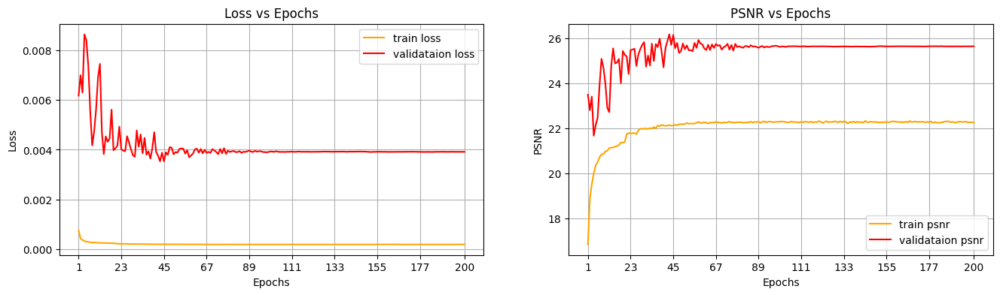

In [75]:
# loss plots
if isinstance(model, DeblurCNN):
    FIG_PATH = f'outputs/loss_psnr_cnn_{cumulative_epochs}.png'
elif isinstance(model, DeblurCNN_RES):
    FIG_PATH = f'outputs/loss_psnr_res_{cumulative_epochs}.png'
elif isinstance(model, DeblurSuperResCNN):
    FIG_PATH = f'outputs/loss_psnr_spres_{cumulative_epochs}.png'
elif isinstance(model, DnCNN):
    FIG_PATH = f'outputs/loss_psnr_dncnn_{cumulative_epochs}.png'
elif isinstance(model, EDSR_Deblur):
    FIG_PATH = f'outputs/loss_psnr_edsr_{cumulative_epochs}.png'

fig, ax = plt.subplots(1, 2, figsize=(16, 4))
ax[0].plot(train_loss, color='orange', label='train loss')
ax[0].plot(val_loss, color='red', label='validataion loss')

num_points = len(train_loss)
num_ticks = 10 if num_points >= 10 else num_points
tick_positions = np.linspace(0, num_points-1, num_ticks, dtype=int)
tick_labels = [pre_trained_epoch + i + 1 for i in tick_positions]
ax[0].set_xticks(ticks=tick_positions, labels=tick_labels)

ax[0].set_title('Loss vs Epochs')
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Loss')
ax[0].legend()
ax[0].grid()

ax[1].plot(train_psnr, color='orange', label='train psnr')
ax[1].plot(val_psnr, color='red', label='validataion psnr')
ax[1].set_xticks(ticks=tick_positions, labels=tick_labels)
ax[1].set_title('PSNR vs Epochs')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('PSNR')
ax[1].legend()
ax[1].grid()

# plt.savefig(DIR_PATH + FIG_PATH)
plt.show()


##### **注意事項與討論：**  

- 本實驗以改良版 DeblurSuperResCNN 模型對經雙重模糊處理的 T91 訓練集進行去模糊化訓練與驗證。

- 從圖中可觀察到，隨著訓練次數增加，左圖中的 Validation Loss 持續下降，而右圖中的 Validation PSNR 則逐漸上升，顯示模型效能穩定提升。當訓練進行至第 90 個 Epoch 左右時，兩者皆趨於穩定，代表模型已進入收斂階段。最終收斂結果如下：
    - Train Loss: 約 0.0002
    - Validation Loss: 約 0.0039
    - Train PSNR: 約 22.2
    - Validation PSNR: 約 25.8

- 相較於示範程式中的原始模型，本實驗所使用的改良版模型在收斂速度與最終效果上皆有更佳表現。然而，由於篇幅限制，此處不展示原始模型的完整結果。

- 與先前的兩種模型相比，DeblurSuperResCNN 在 Validation Loss 與 PSNR 的表現與 DeblurCNN 相近，但略遜於 DeblurCNN_RES，顯示其整體訓練效果相對較弱。

<hr>

#### **2.4 DnCNN 模型**

DnCNN（Denoising Convolutional Neural Network）是一種專為影像去噪、去模糊及其他低階視覺任務而設計的深層卷積神經網路，透過深層結構、批次歸一化和殘差學習的搭配，有效提升了模型在影像去噪與去模糊任務上的表現和泛化能力，成為影像復原領域中常用的標準模型之一。

**模型架構設定：**

- 第一層（輸入層）：

    - 層類型：Conv2d

    - 參數：in_channels=3, out_channels=64, kernel_size=3, padding=1, bias=False

    - 啟用函數：ReLU（inplace=True）

- 第二層至第十六層（中間層，共 15 層）：

    每層都包含以下結構：

    - 子層 1：

        - 層類型：Conv2d

        - 參數：in_channels=64, out_channels=64, kernel_size=3, padding=1, bias=False

    - 子層 2：

        - 層類型：BatchNorm2d

        - 參數：參數：num_features=64

    - 子層 3：

        - 啟用函數：ReLU（inplace=True）

- 第十七層（輸出層）：

    - 層類型：Conv2d

    - 參數：in_channels=64, out_channels=3, kernel_size=3, padding=1, bias=False

    - 啟用函數：無

**文獻來源**： https://arxiv.org/abs/1608.03981

**DnCNN 模型架構示意圖：** \
![DnCNN 模型架構](https://www.researchgate.net/publication/353208796/figure/fig1/AS:1044954730201088@1626148030205/The-DnCNN-Network-Architecture.ppm)

##### **2.4.1 模型初始化與超參數設定**

- `Device` : CPU

- `Learning rate` : 0.0005

- `Optimizer` : Adam

- `Loss Function` : MSELoss

In [169]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
# device = 'cpu'
print('Using {} device'.format(device))

model = DnCNN().to(device)

print(f"Model: {model}")

total_params = sum(p.numel() for p in model.parameters())
print(f"{total_params:,} total parameters.")

total_trainable_params = sum(
        p.numel() for p in model.parameters() if p.requires_grad)
print(f"{total_trainable_params:,} training parameters.")

lr = LEARNING_RATE # Learning rate.
optimizer = optim.Adam(model.parameters(), lr=lr)
print(f"Learning rate: {lr}")
print(f"Optimizer: {optimizer}")
# Loss function.
criterion = nn.MSELoss()
print(f"Loss function: {criterion}")

# scheduler is to reduce the learning rate when a monitored metric (like validation loss) stops improving
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau( 
        optimizer,
        mode='min',
        patience=5,
        factor=0.5,
        # verbose=True
    )


Using cpu device
Model: DnCNN(
  (dncnn): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (3): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): ReLU(inplace=True)
    (5): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (6): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): ReLU(inplace=True)
    (8): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (9): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): ReLU(inplace=True)
    (11): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (12): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (13): ReLU(inplace=True)
    (14): Co

##### **2.4.2 繼續先前訓練的模型（若有）**

In [170]:
if isinstance(model, DeblurCNN):
    WEIGHTS = WEIGHTS_CNN
    print("目前使用的是 DeblurCNN 模型")
elif isinstance(model, DeblurCNN_RES):
    WEIGHTS = WEIGHTS_RES
    print("目前使用的是 DeblurCNN_RES 模型")
elif isinstance(model, DeblurSuperResCNN):
    WEIGHTS = WEIGHTS_SPRES
    print("目前使用的是 DeblurSuperResCNN 模型")
elif isinstance(model, DnCNN):
    WEIGHTS = WEIGHTS_DNCNN
    print("目前使用的是 DnCNN 模型")
elif isinstance(model, EDSR_Deblur):
    WEIGHTS = WEIGHTS_EDSR
    print("目前使用的是 EDSR_Deblur 模型")

# resume training if weights are present.
if os.path.exists(WEIGHTS):
    print('Weights file found. Resuming training...')

    checkpoint = torch.load(WEIGHTS)
    print("Resuming the model state...")
    model.load_state_dict(checkpoint['model_state_dict'])
    pre_trained_epoch = checkpoint['epoch']
    print(f"Resuming training from epoch: {pre_trained_epoch}")
    # Load the optimizer state if available. may not be good idea to resume.
    print("Resuming the optimizer state...")
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
else:
    pre_trained_epoch = 0
    print('No pre-trained file found. Starting training from scratch...')
# print(f"Current Model: {model}")


目前使用的是 DnCNN 模型
Weights file found. Resuming training...
Resuming the model state...
Resuming training from epoch: 200
Resuming the optimizer state...


##### **2.4.3 進行訓練**

In [171]:
train_loss, val_loss = [], []
train_psnr, val_psnr = [], []
start_time = time.time()
epochs = NUM_EPOCHS
for epoch in range(epochs):
    print(f"Epoch {epoch+1} of {epochs}")
    
    train_epoch_loss, train_epoch_psnr = fit(model, trainloader, device, optimizer, criterion)
    val_epoch_loss, val_epoch_psnr = validate(model, valloader, device, criterion)
    train_loss.append(train_epoch_loss)
    train_psnr.append(train_epoch_psnr)
    val_loss.append(val_epoch_loss)
    val_psnr.append(val_epoch_psnr)
    scheduler.step(val_epoch_loss)

end_time = time.time()
print(f"Took {((end_time-start_time)/60):.3f} minutes to train")
print('Saving model...')
# save the model
cumulative_epochs = epochs + pre_trained_epoch

# WEIGHTS_CNN, WEIGHTS_RES, WEIGHTS_SPRES
torch.save({
    'epoch': cumulative_epochs,
    'model_state_dict': model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
    'train_loss': train_loss,
    'val_loss': val_loss
}, WEIGHTS)
print(f"Model saved as {WEIGHTS}")

# 1st 217m 13.6s
# 2nd 206m 4.3s
# 3rd 208m 7.5s
# 4th 393m 42.4s
# 5th 232m 9.2s


Epoch 1 of 2


  0%|          | 0/652 [00:00<?, ?it/s]

100%|██████████| 652/652 [01:55<00:00,  5.66it/s]


Train Loss: 0.00006 - Train PSNR: 27.71 dB


100%|██████████| 2173/2173 [00:17<00:00, 125.75it/s]


Val Loss: 0.00173 - Val PSNR: 30.39 dB
Epoch 2 of 2


100%|██████████| 652/652 [01:53<00:00,  5.73it/s]


Train Loss: 0.00006 - Train PSNR: 27.69 dB


100%|██████████| 2173/2173 [00:17<00:00, 125.55it/s]

Val Loss: 0.00174 - Val PSNR: 30.26 dB
Took 4.395 minutes to train
Saving model...
Model saved as ../outputs/pre_trained_model_dccnn.pt


##### **2.4.4 畫出 epochs 的 Loss 和 PSNR 的趨勢圖**

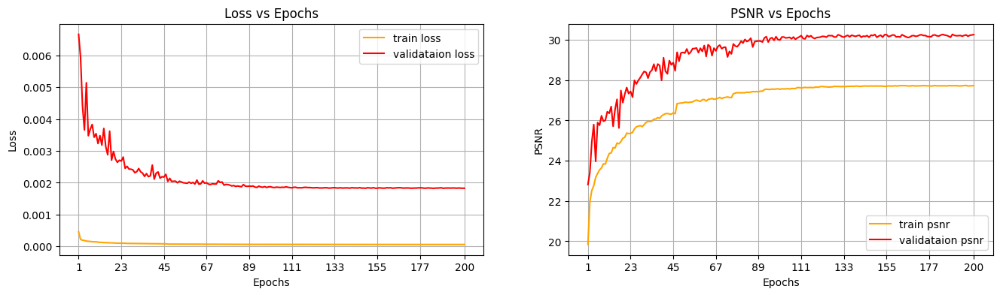

In [79]:
# loss plots
if isinstance(model, DeblurCNN):
    FIG_PATH = f'outputs/loss_psnr_cnn_{cumulative_epochs}.png'
elif isinstance(model, DeblurCNN_RES):
    FIG_PATH = f'outputs/loss_psnr_res_{cumulative_epochs}.png'
elif isinstance(model, DeblurSuperResCNN):
    FIG_PATH = f'outputs/loss_psnr_spres_{cumulative_epochs}.png'
elif isinstance(model, DnCNN):
    FIG_PATH = f'outputs/loss_psnr_dncnn_{cumulative_epochs}.png'
elif isinstance(model, EDSR_Deblur):
    FIG_PATH = f'outputs/loss_psnr_edsr_{cumulative_epochs}.png'

fig, ax = plt.subplots(1, 2, figsize=(16, 4))
ax[0].plot(train_loss, color='orange', label='train loss')
ax[0].plot(val_loss, color='red', label='validataion loss')

num_points = len(train_loss)
num_ticks = 10 if num_points >= 10 else num_points
tick_positions = np.linspace(0, num_points-1, num_ticks, dtype=int)
tick_labels = [pre_trained_epoch + i + 1 for i in tick_positions]
ax[0].set_xticks(ticks=tick_positions, labels=tick_labels)

ax[0].set_title('Loss vs Epochs')
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Loss')
ax[0].legend()
ax[0].grid()

ax[1].plot(train_psnr, color='orange', label='train psnr')
ax[1].plot(val_psnr, color='red', label='validataion psnr')
ax[1].set_xticks(ticks=tick_positions, labels=tick_labels)
ax[1].set_title('PSNR vs Epochs')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('PSNR')
ax[1].legend()
ax[1].grid()

# plt.savefig(DIR_PATH + FIG_PATH)
plt.show()


##### **注意事項與討論：**  

- 本實驗以 DnCNN 模型對經雙重模糊處理的 T91 訓練集進行去模糊化訓練與驗證。

- 從圖中可觀察到，隨著訓練次數增加，左圖中的 Validation Loss 持續下降，而右圖中的 Validation PSNR 則逐漸上升，顯示模型效能穩定提升。當訓練進行至第 130 個 Epoch 左右時，兩者皆趨於穩定，代表模型已進入收斂階段。最終收斂結果如下：
    - Train Loss: 約 0.0001
    - Validation Loss: 約 0.0018
    - Train PSNR: 約 27.9
    - Validation PSNR: 約 30.1

- 與先前的三種模型相比，DnCNN 在 Validation Loss 與 PSNR 表現上皆更優異，顯示該模型在訓練效果上確實具有更佳的性能。

<hr>

#### **2.5 EDSR 模型**

EDSR（Enhanced Deep Super-Resolution Network）是由 Lim 等人在 2017 年提出的超解析度重建模型，其核心特點是移除批次正規化層（Batch Normalization）以提高性能，並堆疊多個 Residual Block 以加強深層特徵學習能力。相比傳統 SRCNN 或 VDSR，EDSR 可達到更高的重建品質，尤其在 PSNR 方面有顯著提升。其特別適合用於圖像超解析與影像重建任務。在本實驗中，EDSR 架構亦被應用於圖像去模糊任務，並調整了其殘差塊數量，以加快訓練效率。

**模型架構設定：**

- 第一層（輸入層）：

    - 層類型：Conv2d

    - 參數：in_channels=3, out_channels=64, kernel_size=3, padding=1

    - 啟用函數：無

- 第二層至第五層（ResidualBlock × 4）：

   每個 Residual Block 均包含以下結構：

    - 子層 1：

        - 層類型：Conv2d

        - 參數：in_channels=64, out_channels=64, kernel_size=3, padding=1

        - 啟用函數：ReLU(inplace=True)

    - 子層 2：

        - 層類型：Conv2d

        - 參數：in_channels=64, out_channels=64, kernel_size=3, padding=1

        - 啟用函數：無
    
    - 殘差連接：輸入與子層 2 輸出相加：out = x + F(x)

- 最後一層（輸出層）：

    - 層類型：Conv2d

    - 參數：in_channels=64, out_channels=3, kernel_size=3, padding=1

    - 啟用函數：無（直接輸出 RGB 圖片）

**文獻來源**： https://arxiv.org/abs/1707.02921

**EDSR 模型架構示意圖：** \
![EDSR 模型架構](https://www.researchgate.net/publication/365226917/figure/fig2/AS:11431281096348699@1668114989745/Structure-of-enhanced-deep-residual-networks-EDSR.ppm)

##### **2.5.1 模型初始化與超參數設定**

- `Device` : CPU

- `Learning rate` : 0.0005

- `Optimizer` : Adam

- `Loss Function` : MSELoss

In [172]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
# device = 'cpu'
print('Using {} device'.format(device))

model = EDSR_Deblur().to(device)

print(f"Model: {model}")

total_params = sum(p.numel() for p in model.parameters())
print(f"{total_params:,} total parameters.")

total_trainable_params = sum(
        p.numel() for p in model.parameters() if p.requires_grad)
print(f"{total_trainable_params:,} training parameters.")

lr = LEARNING_RATE # Learning rate.
optimizer = optim.Adam(model.parameters(), lr=lr)
print(f"Learning rate: {lr}")
print(f"Optimizer: {optimizer}")
# Loss function.
criterion = nn.MSELoss()
print(f"Loss function: {criterion}")

# scheduler is to reduce the learning rate when a monitored metric (like validation loss) stops improving
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau( 
        optimizer,
        mode='min',
        patience=5,
        factor=0.5,
        # verbose=True
    )


Using cpu device
Model: EDSR_Deblur(
  (head): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (body): Sequential(
    (0): ResidualBlock(
      (block): Sequential(
        (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): ReLU(inplace=True)
        (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      )
    )
    (1): ResidualBlock(
      (block): Sequential(
        (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): ReLU(inplace=True)
        (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      )
    )
    (2): ResidualBlock(
      (block): Sequential(
        (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): ReLU(inplace=True)
        (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      )
    )
    (3): ResidualBlock(
      (block): Sequential(
        (0): Conv2d(64, 64, kernel_size=(3, 3), st

##### **2.5.2 繼續先前訓練的模型（若有）**

In [173]:
if isinstance(model, DeblurCNN):
    WEIGHTS = WEIGHTS_CNN
    print("目前使用的是 DeblurCNN 模型")
elif isinstance(model, DeblurCNN_RES):
    WEIGHTS = WEIGHTS_RES
    print("目前使用的是 DeblurCNN_RES 模型")
elif isinstance(model, DeblurSuperResCNN):
    WEIGHTS = WEIGHTS_SPRES
    print("目前使用的是 DeblurSuperResCNN 模型")
elif isinstance(model, DnCNN):
    WEIGHTS = WEIGHTS_DNCNN
    print("目前使用的是 DnCNN 模型")
elif isinstance(model, EDSR_Deblur):
    WEIGHTS = WEIGHTS_EDSR
    print("目前使用的是 EDSR_Deblur 模型")

# resume training if weights are present.
if os.path.exists(WEIGHTS):
    print('Weights file found. Resuming training...')

    checkpoint = torch.load(WEIGHTS)
    print("Resuming the model state...")
    model.load_state_dict(checkpoint['model_state_dict'])
    pre_trained_epoch = checkpoint['epoch']
    print(f"Resuming training from epoch: {pre_trained_epoch}")
    # Load the optimizer state if available. may not be good idea to resume.
    print("Resuming the optimizer state...")
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
else:
    pre_trained_epoch = 0
    print('No pre-trained file found. Starting training from scratch...')
# print(f"Current Model: {model}")


目前使用的是 EDSR_Deblur 模型
Weights file found. Resuming training...
Resuming the model state...
Resuming training from epoch: 200
Resuming the optimizer state...


##### **2.5.3 進行訓練**

In [174]:
train_loss, val_loss = [], []
train_psnr, val_psnr = [], []
start_time = time.time()
epochs = NUM_EPOCHS
for epoch in range(epochs):
    print(f"Epoch {epoch+1} of {epochs}")
    
    train_epoch_loss, train_epoch_psnr = fit(model, trainloader, device, optimizer, criterion)
    val_epoch_loss, val_epoch_psnr = validate(model, valloader, device, criterion)
    train_loss.append(train_epoch_loss)
    train_psnr.append(train_epoch_psnr)
    val_loss.append(val_epoch_loss)
    val_psnr.append(val_epoch_psnr)
    scheduler.step(val_epoch_loss)

end_time = time.time()
print(f"Took {((end_time-start_time)/60):.3f} minutes to train")
print('Saving model...')
# save the model
cumulative_epochs = epochs + pre_trained_epoch

# WEIGHTS_CNN, WEIGHTS_RES, WEIGHTS_SPRES
torch.save({
    'epoch': cumulative_epochs,
    'model_state_dict': model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
    'train_loss': train_loss,
    'val_loss': val_loss
}, WEIGHTS)
print(f"Model saved as {WEIGHTS}")

# 1st 217m 13.6s
# 2nd 206m 4.3s
# 3rd 208m 7.5s
# 4th 393m 42.4s
# 5th 232m 9.2s


Epoch 1 of 2


100%|██████████| 652/652 [01:06<00:00,  9.78it/s]


Train Loss: 0.00005 - Train PSNR: 28.21 dB


100%|██████████| 2173/2173 [00:10<00:00, 209.32it/s]


Val Loss: 0.00162 - Val PSNR: 30.80 dB
Epoch 2 of 2


100%|██████████| 652/652 [01:04<00:00, 10.18it/s]


Train Loss: 0.00005 - Train PSNR: 28.22 dB


100%|██████████| 2173/2173 [00:10<00:00, 208.75it/s]

Val Loss: 0.00162 - Val PSNR: 30.80 dB
Took 2.524 minutes to train
Saving model...
Model saved as ../outputs/pre_trained_model_edsr.pt


##### **2.5.4 畫出 epochs 的 Loss 和 PSNR 的趨勢圖**

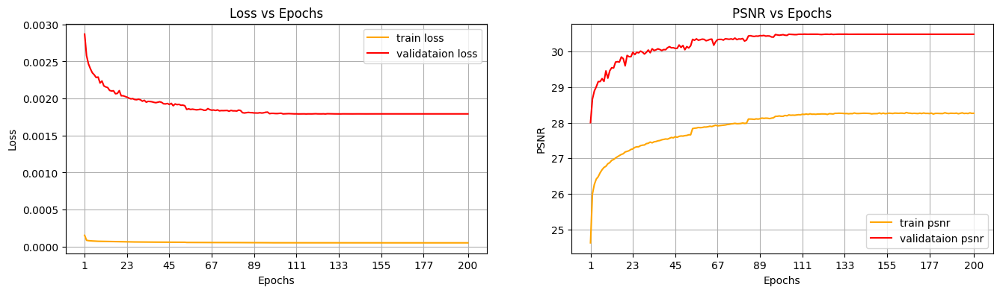

In [83]:
# loss plots
if isinstance(model, DeblurCNN):
    FIG_PATH = f'outputs/loss_psnr_cnn_{cumulative_epochs}.png'
elif isinstance(model, DeblurCNN_RES):
    FIG_PATH = f'outputs/loss_psnr_res_{cumulative_epochs}.png'
elif isinstance(model, DeblurSuperResCNN):
    FIG_PATH = f'outputs/loss_psnr_spres_{cumulative_epochs}.png'
elif isinstance(model, DnCNN):
    FIG_PATH = f'outputs/loss_psnr_dncnn_{cumulative_epochs}.png'
elif isinstance(model, EDSR_Deblur):
    FIG_PATH = f'outputs/loss_psnr_edsr_{cumulative_epochs}.png'

fig, ax = plt.subplots(1, 2, figsize=(16, 4))
ax[0].plot(train_loss, color='orange', label='train loss')
ax[0].plot(val_loss, color='red', label='validataion loss')

num_points = len(train_loss)
num_ticks = 10 if num_points >= 10 else num_points
tick_positions = np.linspace(0, num_points-1, num_ticks, dtype=int)
tick_labels = [pre_trained_epoch + i + 1 for i in tick_positions]
ax[0].set_xticks(ticks=tick_positions, labels=tick_labels)

ax[0].set_title('Loss vs Epochs')
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Loss')
ax[0].legend()
ax[0].grid()

ax[1].plot(train_psnr, color='orange', label='train psnr')
ax[1].plot(val_psnr, color='red', label='validataion psnr')
ax[1].set_xticks(ticks=tick_positions, labels=tick_labels)
ax[1].set_title('PSNR vs Epochs')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('PSNR')
ax[1].legend()
ax[1].grid()

# plt.savefig(DIR_PATH + FIG_PATH)
plt.show()


##### **注意事項與討論：**  

- 本實驗以 EDSR 模型對經雙重模糊處理的 T91 訓練集進行去模糊化訓練與驗證。

- 從圖中可觀察到，隨著訓練次數增加，左圖中的 Validation Loss 持續下降，而右圖中的 Validation PSNR 則逐漸上升，顯示模型效能穩定提升。當訓練進行至第 110 個 Epoch 左右時，兩者皆趨於穩定，代表模型已進入收斂階段。最終收斂結果如下：
    - Train Loss: 約 0.0001
    - Validation Loss: 約 0.0018
    - Train PSNR: 約 28.3
    - Validation PSNR: 約 30.4

- 與先前的四種模型相比，EDSR 在 Validation Loss 與 PSNR 表現上皆更優異，顯示該模型在訓練效果上確實具有更佳的性能。綜合訓練表現而言，EDSR 模型最為出色，但仍需搭配後續的驗證結果，才能準確判斷其實際效果是否優於其他模型。

<hr>
<hr>

### **<font color=cornflowerblue>第 3 步：模型驗證測試</font>**  

本實驗旨在建立一個具備最佳去模糊效果的模型，因此其泛化能力亦是評估重點。為驗證各模型在未見資料上的表現，首先選擇 Set5 中的 butterfly.png 作為驗證圖片，比較五種模型的 Test PSNR 值，數值最高者即視為效果最佳的模型。接著，將 Set5 和 Set14 中的所有圖片進行雙重模糊處理，並使用前述表現最佳的模型進行復原，以觀察其整體去模糊效果。最後，再隨機選擇一張全新圖片進行模糊與復原，並計算出模糊圖與去模糊圖兩者的 PSNR 值，藉此驗證該模型在未知資料上的泛化能力。

驗證集來源： https://www.kaggle.com/datasets/ll01dm/set-5-14-super-resolution-dataset

#### **3.1 比較各個模型的驗證效果**

##### **3.1.1 繪製各模型對蝴蝶圖片進行去模糊化後的結果，依序呈現原圖、模糊圖與去模糊圖，並計算模糊圖與去模糊圖相對於原圖的 PSNR 值。**

In [ ]:
# load an image from pictures directory
sharp = cv2.imread('../inputs/Set5/butterfly.PNG', cv2.IMREAD_COLOR)
sharp = cv2.cvtColor(sharp, cv2.COLOR_BGR2RGB)
sharp_tensor = transforms.ToPILImage()(sharp)
sharp_tensor = transforms.ToTensor()(sharp_tensor)
sharp_tensor = sharp_tensor.unsqueeze(0) # add batch dimension
# add gaussian blurring
blur = cv2.GaussianBlur(sharp, (7, 7), 0)
height, width = blur.shape[:2]
small = cv2.resize(blur, (width // 3, height // 3), interpolation=cv2.INTER_AREA)
restored = cv2.resize(small, (width, height), interpolation=cv2.INTER_LINEAR)
# convert the blur to tensor without resizing
blur_tensor = transforms.ToPILImage()(restored)
blur_tensor = transforms.ToTensor()(blur_tensor)
blur_tensor = blur_tensor.unsqueeze(0) # add batch dimension
blur_tensor = blur_tensor.to(device)

# deblur the image
with torch.no_grad():
    deblurred_tensor = model(blur_tensor)

psnr_blur = psnr(sharp_tensor, blur_tensor)
psnr_deblur = psnr(sharp_tensor, deblurred_tensor)

# 畫圖
if isinstance(model, DeblurCNN):
    FIG_PATH_TEST = f'outputs/test_cnn_{cumulative_epochs}.png'
elif isinstance(model, DeblurCNN_RES):
    FIG_PATH_TEST = f'outputs/test_res_{cumulative_epochs}.png'
elif isinstance(model, DeblurSuperResCNN):
    FIG_PATH_TEST = f'outputs/test_spres_{cumulative_epochs}.png'
elif isinstance(model, DnCNN):
    FIG_PATH_TEST = f'outputs/test_dncnn_{cumulative_epochs}.png'
elif isinstance(model, EDSR_Deblur):
    FIG_PATH_TEST = f'outputs/test_edsr_{cumulative_epochs}.png'

fig, ax = plt.subplots(1, 3, figsize=(12, 4))
img0 = blur_tensor.squeeze(0).cpu().permute(1, 2, 0).numpy()
img1 = deblurred_tensor.squeeze(0).cpu().permute(1, 2, 0).numpy()

# Clip to [0, 1] if float, or [0, 255] if uint8
img0 = np.clip(img0, 0, 1)
img1 = np.clip(img1, 0, 1)

ax[0].imshow(sharp)
ax[0].set_title('Sharp Image')
ax[0].axis('off')
ax[1].imshow(img0)
ax[1].set_title('Blurred Image: PNSR: {:.2f} dB'.format(psnr_blur))
ax[1].axis('off')
ax[2].imshow(img1)
ax[2].set_title('Deblurred Image: PNSR: {:.2f} dB'.format(psnr_deblur))
ax[2].axis('off')
# plt.savefig(DIR_PATH + FIG_PATH_TEST)
plt.show()

##### **3.1.2 比較各模型對蝴蝶圖片進行去模糊化後的結果，一樣依序呈現原圖、模糊圖與去模糊圖，並計算模糊圖與去模糊圖相對於原圖的 PSNR 值。**

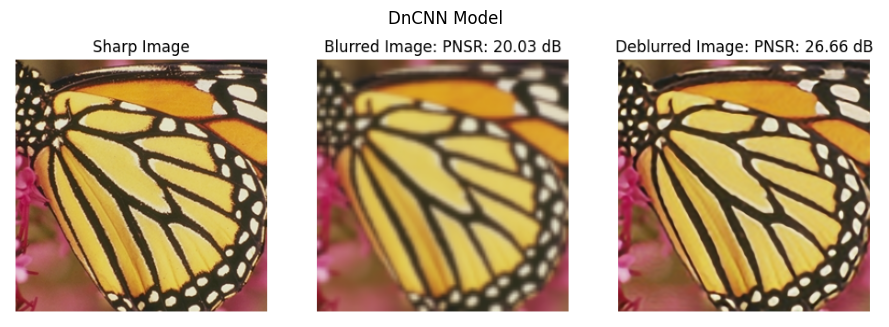

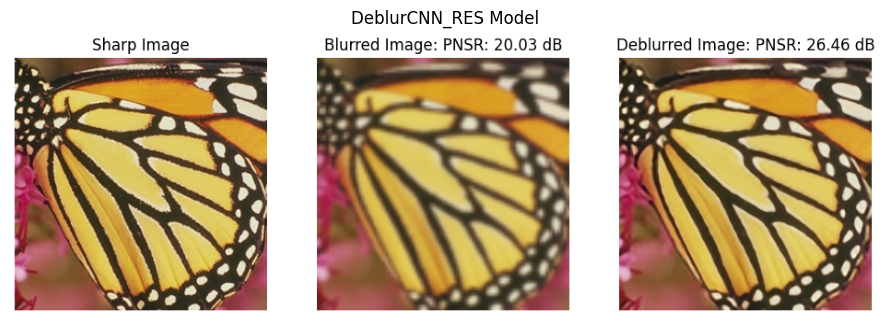

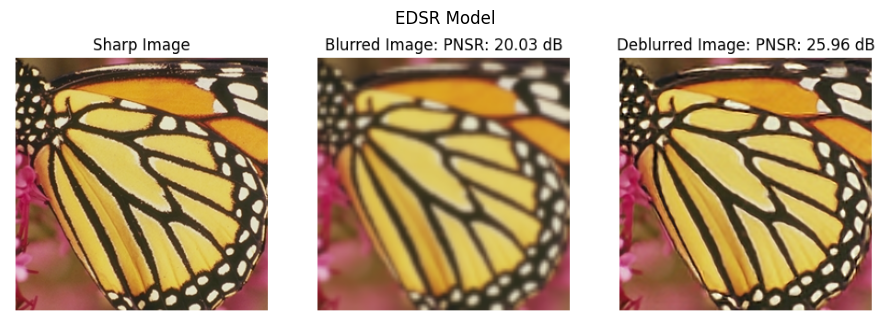

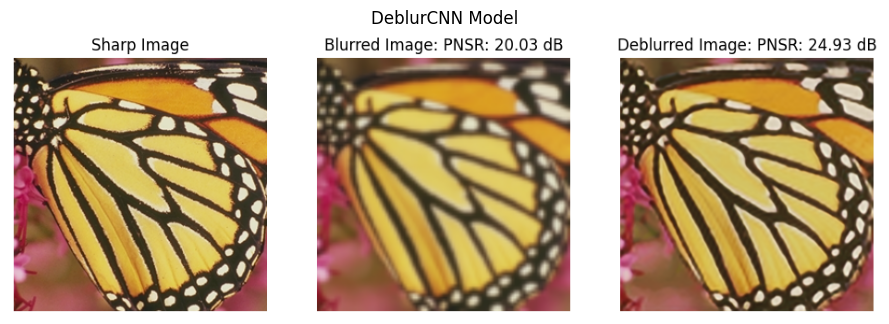

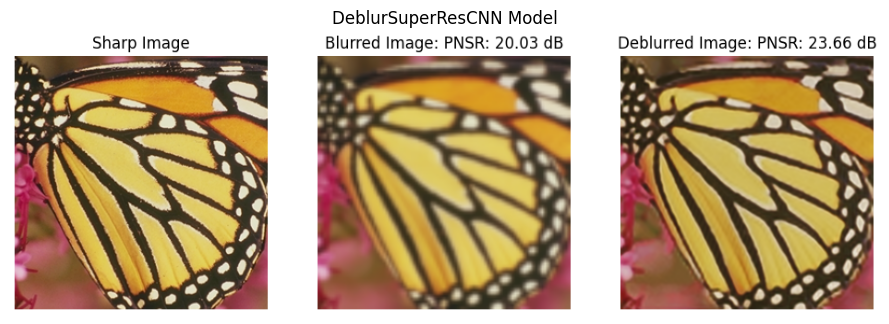

In [139]:
def show_image(filename, title):
    img = Image.open(os.path.join(DIR_PATH, f'outputs/{filename}.png'))
    # 顯示圖片
    plt.figure(figsize=(9, 4))
    plt.imshow(img)
    plt.axis('off')  # 不顯示座標軸
    plt.title(title)  # 可加上標題
    plt.tight_layout()
    plt.show()

filenames = ['test_dncnn_200_test', 'test_res_200_test', 'test_edsr_200_test', 'test_cnn_200_test', 'test_spres_200_test']
titles = ['DnCNN Model', 'DeblurCNN_RES Model', 'EDSR Model', 'DeblurCNN Model', 'DeblurSuperResCNN Model']
for filename, title in zip(filenames, titles):
    show_image(filename, title)

##### **注意事項與討論：**  

- 上方展示為五種模型在驗證圖像（蝴蝶圖）上的去模糊結果。根據去模糊後的 PSNR 值由高至低排序如下： \
DnCNN 模型（26.66 dB）、DeblurCNN_RES 模型（26.46 dB）、EDSR 模型（25.96 dB）、DeblurCNN 模型（24.93 dB）、以及 DeblurSuperResCNN 模型（23.66 dB）。

- 可以觀察到，與訓練階段的結果不同，原先表現最佳的 EDSR 模型在驗證階段的 PSNR 反而低於 DnCNN 與 DeblurCNN_RES 模型，顯示出該模型可能出現 **過擬合（overfitting）** 現象。而其他模型在驗證階段的表現則與訓練趨勢相符，沒有明顯落差。

- 綜合評估訓練與驗證結果後，**DnCNN 模型**被選為整體表現最佳的模型，並將於後續實驗中作為主力模型進行進一步測試與驗證。

<hr>

#### **3.2 將 Set5 和 Set14 中的所有圖片進行雙重模糊處理，並使用 DnCNN 模型進行復原，以觀察其整體去模糊效果。**

In [132]:
# ========= 1. 讀取圖片 ========== #
def load_images_cv2(folders, image_extensions={'.png', '.jpg', '.jpeg'}):
    image_dict = {}
    for folder in folders:
        image_list = []
        for filename in sorted(os.listdir(folder)):
            ext = os.path.splitext(filename)[1].lower()
            if ext in image_extensions:
                img_path = os.path.join(folder, filename)
                img = cv2.imread(img_path, cv2.IMREAD_COLOR)
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # 轉為 RGB 格式
                image_list.append((filename, img))
        image_dict[folder] = image_list
    return image_dict

# 用法
folders = [DIR_PATH + "inputs/Set5", DIR_PATH + "inputs/Set14"]
all_images = load_images_cv2(folders)

# ========= 2. 載入模型 ========== #
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = DnCNN()
model_path = os.path.join(DIR_PATH, 'outputs/pre_trained_model_dccnn_.pt')
checkpoint = torch.load(model_path, map_location=device)
model.load_state_dict(checkpoint['model_state_dict'])
model.to(device)
model.eval()

# ========= 3. 處理圖片並去模糊 ========== #
def model_test(sharp, model):
    # Convert to Tensor
    sharp_tensor = transforms.ToPILImage()(sharp)
    sharp_tensor = transforms.ToTensor()(sharp_tensor).unsqueeze(0).to(device)

    # 雙重模糊處理
    blur = cv2.GaussianBlur(sharp, (7, 7), 0)
    height, width = blur.shape[:2]
    small = cv2.resize(blur, (width // 3, height // 3), interpolation=cv2.INTER_AREA)
    restored = cv2.resize(small, (width, height), interpolation=cv2.INTER_LINEAR)

    # 轉換成 Tensor
    blur_tensor = transforms.ToPILImage()(restored)
    blur_tensor = transforms.ToTensor()(blur_tensor).unsqueeze(0).to(device)

    # 模型推論
    with torch.no_grad():
        deblurred_tensor = model(blur_tensor)

    # PSNR 計算
    psnr_blur = psnr(sharp_tensor, blur_tensor)
    psnr_deblur = psnr(sharp_tensor, deblurred_tensor)

    # 圖像顯示
    fig, ax = plt.subplots(1, 3, figsize=(9, 4))
    img0 = blur_tensor.squeeze(0).cpu().permute(1, 2, 0).numpy()
    img1 = deblurred_tensor.squeeze(0).cpu().permute(1, 2, 0).numpy()

    # Clip to [0, 1] if float, or [0, 255] if uint8
    img0 = np.clip(img0, 0, 1)
    img1 = np.clip(img1, 0, 1)

    ax[0].imshow(sharp)
    ax[0].set_title('Sharp Image')
    ax[0].axis('off')

    ax[1].imshow(img0)
    ax[1].set_title('Blurred Image: PSNR: {:.2f} dB'.format(psnr_blur))
    ax[1].axis('off')

    ax[2].imshow(img1)
    ax[2].set_title('Deblurred Image: PSNR: {:.2f} dB'.format(psnr_deblur))
    ax[2].axis('off')

    plt.tight_layout()
    plt.show()
    

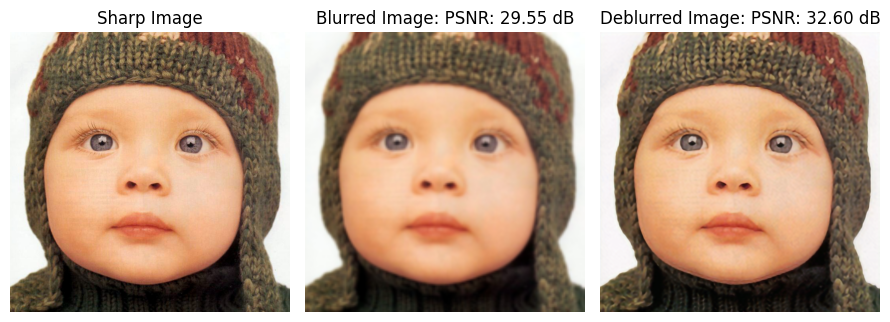

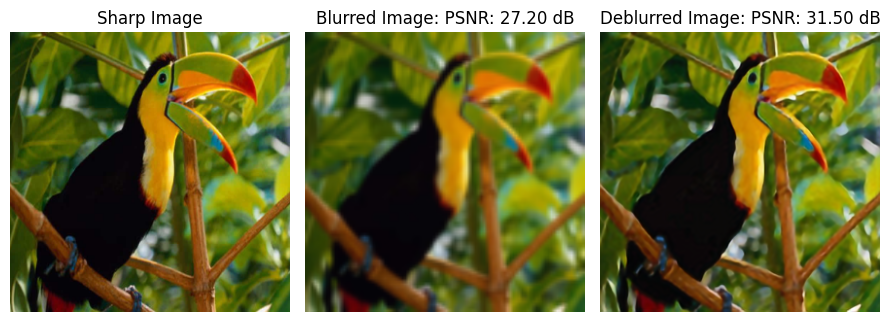

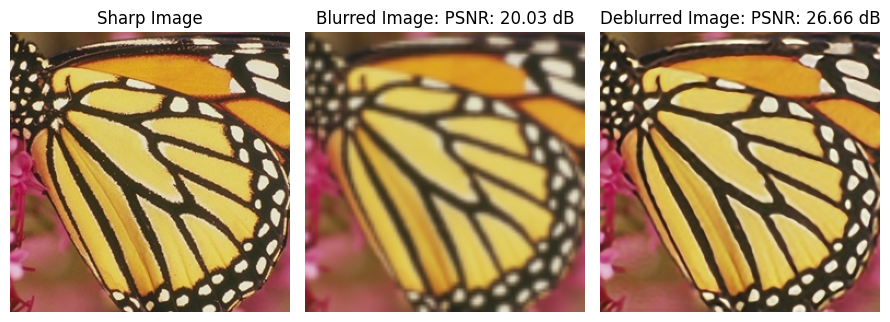

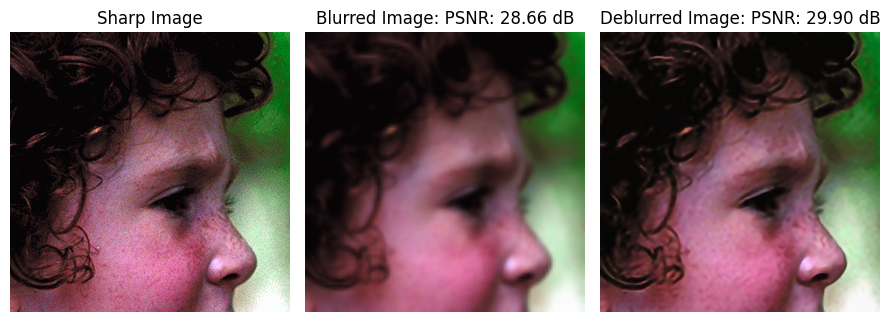

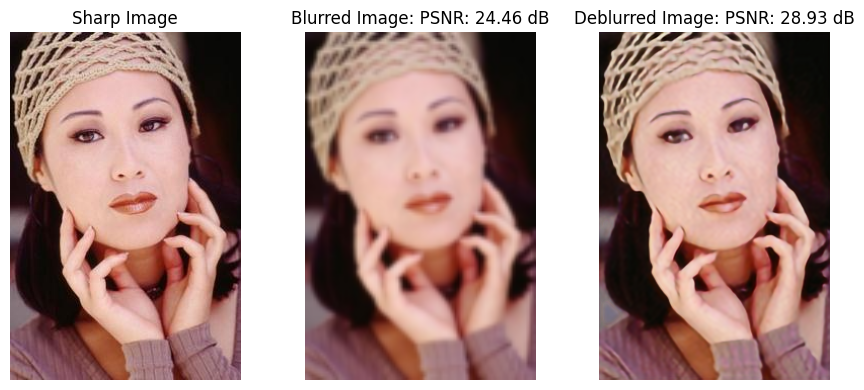

...

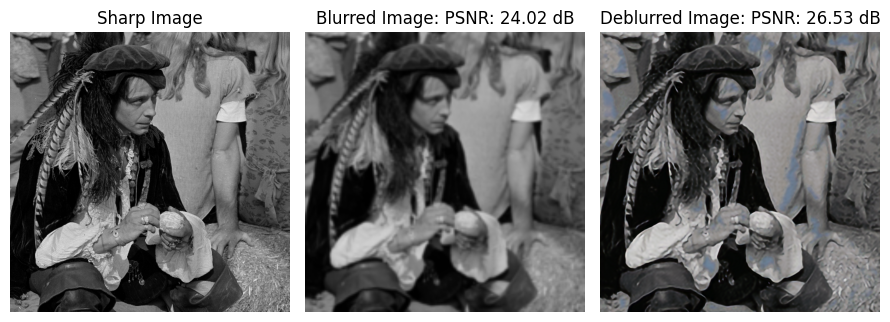

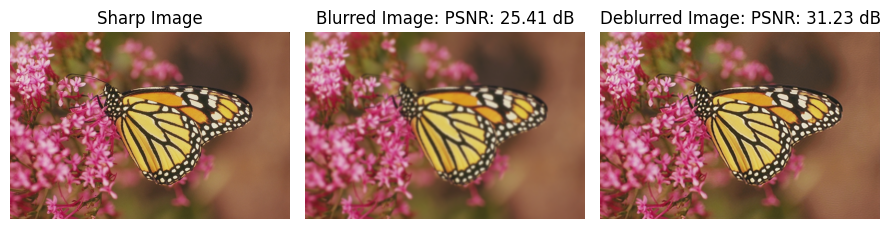

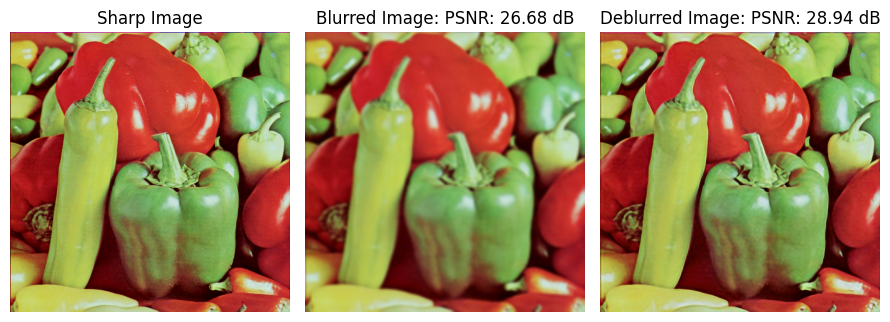

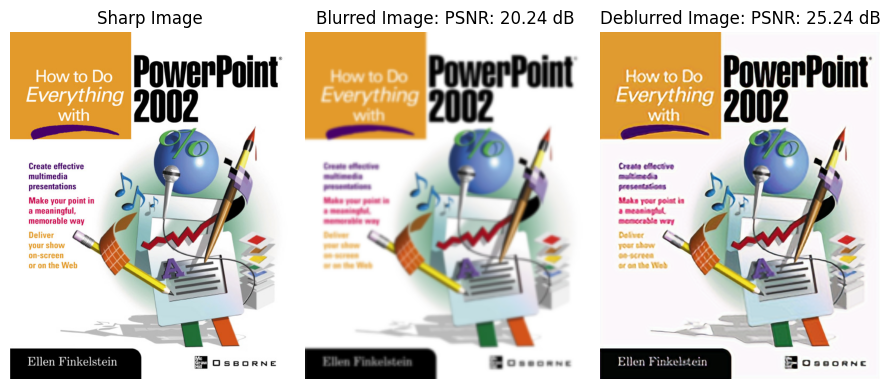

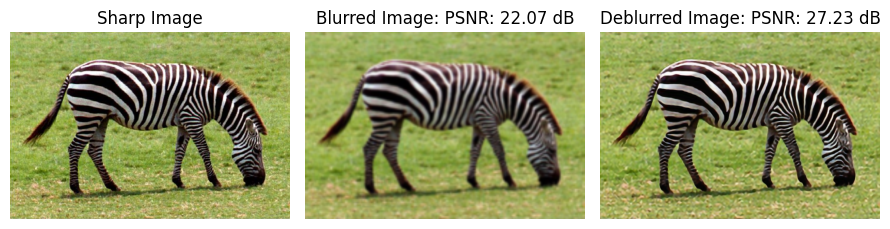

In [ ]:
# # 顯示圖片
# img = all_images[folders[0]][2][1]  # [folders[第幾個file]][第幾張圖片][1=圖片本身（不更動）]
# model_test(img, model)

for i in range(0, 2):
    for j in range(0, len(all_images[folders[i]])):
        # 顯示圖片
        img = all_images[folders[i]][j][1]  # [folders[第幾個file]][第幾張圖片][1=圖片本身（不更動）]
        model_test(img, model)

##### **注意事項與討論：**  

- 上述 19 張圖分別展示了每張圖經過相同的雙重模糊處理（高斯模糊 + 縮小再放大）後的模糊程度，以及經由 DnCNN 模型去模糊後的復原情況。儘管模糊處理方式一致，不同圖像的內容特性（如細節密度、對比度、紋理結構）導致模糊程度與去模糊效果呈現明顯差異。例如：蝴蝶圖樣邊緣輪廓明顯，模糊後仍保有可辨識的結構，因此模型去模糊效果穩定；而人物臉部或毛髮等紋理柔和、細節密集的圖像，模糊後部分細節難以辨識，模型復原的難度也相對增加。

- 此外，圖像本身的頻率特性也影響模型效果。以人臉圖像為例，其整體輪廓屬於低頻訊號，即使經過模糊處理，形狀仍較易保留，因此模型在輪廓層面能有良好表現；但臉部上的高頻細節（如皮膚紋理、髮絲等）一旦被模糊，訊號損失較為嚴重，使得模型在細節還原上效果有限。這也解釋了部分人臉圖片視覺上看似清晰，實際 PSNR 卻不高的情況。

- 雖然 DnCNN 模型在訓練集上表現良好，但由於訓練所用的 T91 圖片集中大多為花卉、建築與自然景物，較少涵蓋人物、動物等多樣性主題，因此模型的泛化能力在面對 Set5 與 Set14 中較為複雜或未見過的圖像時，效果會有落差，造成去模糊表現不一。

- 最後，有些圖片的 PSNR 較低，但視覺上已明顯改善；反之亦然。因此，在評估模型表現時，應同時考量客觀指標與視覺品質，進行綜合判斷。由此可知，PSNR 僅是量化評估的一種方式，對細節與人眼主觀感受並不總是完全一致。

<hr>

#### **3.3 隨機選擇一張全新圖片進行模糊與復原，並計算出模糊圖與去模糊圖兩者的 PSNR 值，藉此驗證該模型在未知資料上的泛化能力。**

圖片來源： https://www.upmedia.mg/upload/article/20201021200358575033.jpg

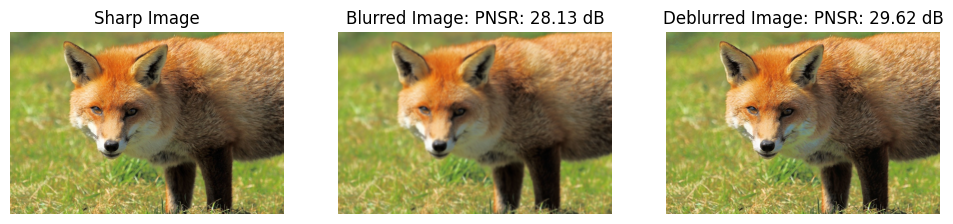

In [157]:
# ========= 1. 載入模型 ========== #
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = DnCNN()
model_path = os.path.join(DIR_PATH, 'outputs/pre_trained_model_dccnn_.pt')
checkpoint = torch.load(model_path, map_location=device)
model.load_state_dict(checkpoint['model_state_dict'])
model.to(device)
model.eval()

# ========= 2. 處理圖片並去模糊 ========== #
# load an image from pictures directory
sharp = cv2.imread('../inputs/fox.jpg', cv2.IMREAD_COLOR)
sharp = cv2.cvtColor(sharp, cv2.COLOR_BGR2RGB)
sharp_tensor = transforms.ToPILImage()(sharp)
sharp_tensor = transforms.ToTensor()(sharp_tensor)
sharp_tensor = sharp_tensor.unsqueeze(0).to(device) # add batch dimension
# add gaussian blurring
blur = cv2.GaussianBlur(sharp, (7, 7), 0)
height, width = blur.shape[:2]
small = cv2.resize(blur, (width // 3, height // 3), interpolation=cv2.INTER_AREA)
restored = cv2.resize(small, (width, height), interpolation=cv2.INTER_LINEAR)
# convert the blur to tensor without resizing
blur_tensor = transforms.ToPILImage()(restored)
blur_tensor = transforms.ToTensor()(blur_tensor)
blur_tensor = blur_tensor.unsqueeze(0).to(device) # add batch dimension

# deblur the image
with torch.no_grad():
    deblurred_tensor = model(blur_tensor)

psnr_blur = psnr(sharp_tensor, blur_tensor)
psnr_deblur = psnr(sharp_tensor, deblurred_tensor)

fig, ax = plt.subplots(1, 3, figsize=(12, 4))
img0 = blur_tensor.squeeze(0).cpu().permute(1, 2, 0).numpy()
img1 = deblurred_tensor.squeeze(0).cpu().permute(1, 2, 0).numpy()

# Clip to [0, 1] if float, or [0, 255] if uint8
img0 = np.clip(img0, 0, 1)
img1 = np.clip(img1, 0, 1)

ax[0].imshow(sharp)
ax[0].set_title('Sharp Image')
ax[0].axis('off')
ax[1].imshow(img0)
ax[1].set_title('Blurred Image: PNSR: {:.2f} dB'.format(psnr_blur))
ax[1].axis('off')
ax[2].imshow(img1)
ax[2].set_title('Deblurred Image: PNSR: {:.2f} dB'.format(psnr_deblur))
ax[2].axis('off')
# plt.savefig(DIR_PATH + FIG_PATH_TEST)
plt.show()

##### **注意事項與討論：**  

- 本步驟以一張未曾出現在訓練與驗證集（T91、Set5、Set14）中的全新圖片進行測試，藉此觀察模型的泛化能力。首先將原始圖像進行雙重模糊處理，再分別計算模糊圖和去模糊圖與原圖之間的 PSNR 值。從結果可以看到，DnCNN 能夠有效提升模糊圖像的 PSNR，說明模型確實學會了從模糊圖像中恢復細節與邊界。

- 從實驗結果來看，即使是來自網路、與訓練數據分布不同的全新圖片，DnCNN 依然能夠將圖像恢復到接近原始清晰度，PSNR 明顯提升，顯示模型在真實應用下具備一定的泛化能力。

- 此外，PSNR 作為量化指標，雖然能反映復原效果的數值提升，但有時人眼主觀上會認為去模糊圖已經非常接近原圖，即使 PSNR 並非最高，正如本次案例所示。因此，實際應用時建議同時兼顧主觀視覺感受與客觀評估指標。

- 綜合來說，本實驗驗證了所訓練的 DnCNN 模型不僅能處理訓練集內的模糊圖像，對於未見過的新圖片也具備不錯的去模糊能力，證明模型有良好的泛化表現，適合應用於真實世界的去模糊任務。

<hr>
<hr>